In [ ]:
import numpy as np 
import pandas as pd 
# Utility
import os
import glob
import random
import scipy
import warnings
warnings.filterwarnings('ignore')
# Computer vision
from PIL import Image
from skimage import io, color, measure
import skimage.filters as skifilters
# Data science
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import umap
# Machine learning
from sklearn.decomposition import PCA
import umap

plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.family'] = 'STIXGeneral'
plt.rcParams['axes.axisbelow'] = True
plt.rcParams.update({'font.size': 16})
print("Libraries imported")

Libraries imported


Create a figure folder to save the figures 

In [3]:
import os
folder_path = "./figures"  
if os.path.isdir(folder_path):
    pass
else:
    os.mkdir(folder_path)

H1: Candida albicans
H2: Aspergillus niger
H3: Trichophyton rubrum
H5: Trichophyton mentagrophytes
H6: Epidermophyton floccosum
We create tree typical hash map data structures for the train, validation and test set. First we utilize glob to grab all the image links in each subfolder that correspond to each of the classes using UNIX file searching.

In [ ]:
import glob

targets = ["H1", "H2", "H3", "H5", "H6"]
datasets = ["test", "train", "valid"]

base_path = "/Users/erdem/model-playground/data"  

test_dict = {}
train_dict = {}
val_dict = {}

# Populate dictionaries with file paths
for target in targets:
    test_dict[target] = glob.glob(f"{base_path}/test/{target}/*")
    train_dict[target] = glob.glob(f"{base_path}/train/{target}/*")
    val_dict[target] = glob.glob(f"{base_path}/valid/{target}/*")




Test Dictionary: {'H1': ['/Users/erdem/model-playground/data/test/H1/H1_62a_15.jpg.jpg', '/Users/erdem/model-playground/data/test/H1/H1_77a_3.jpg.jpg', '/Users/erdem/model-playground/data/test/H1/H1_56b_5.jpg.jpg', '/Users/erdem/model-playground/data/test/H1/H1_74d_16.jpg.jpg', '/Users/erdem/model-playground/data/test/H1/H1_105c_7.jpg.jpg', '/Users/erdem/model-playground/data/test/H1/H1_29c_16.jpg.jpg', '/Users/erdem/model-playground/data/test/H1/H1_98c_2.jpg.jpg', '/Users/erdem/model-playground/data/test/H1/H1_102b_18.jpg.jpg', '/Users/erdem/model-playground/data/test/H1/H1_41a_12.jpg.jpg', '/Users/erdem/model-playground/data/test/H1/H1_107b_7.jpg.jpg', '/Users/erdem/model-playground/data/test/H1/H1_75c_7.jpg.jpg', '/Users/erdem/model-playground/data/test/H1/H1_5b_2.jpg.jpg', '/Users/erdem/model-playground/data/test/H1/H1_102a_2.jpg.jpg', '/Users/erdem/model-playground/data/test/H1/H1_95a_17.jpg.jpg', '/Users/erdem/model-playground/data/test/H1/H1_49b_9.jpg.jpg', '/Users/erdem/model-p

In [5]:
test_class_dist = {key:len(value) for key,value in test_dict.items()}
train_class_dist = {key:len(value) for key,value in train_dict.items()}
val_class_dist = {key:len(value) for key,value in val_dict.items()}

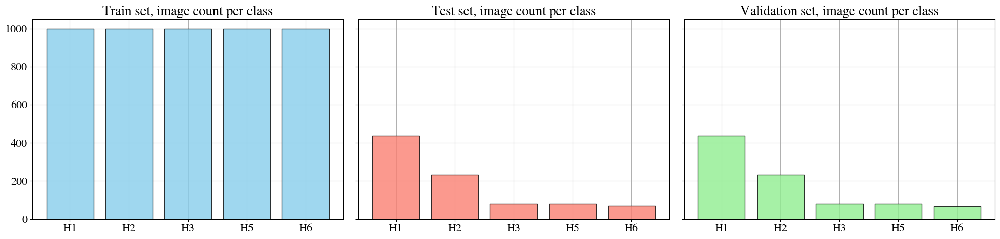

In [6]:
fig, axes = plt.subplots(1, 3, figsize=(20, 5),sharey=True)
axes[0].bar(x = list(train_class_dist.keys()),height = train_class_dist.values(), color = "skyblue", edgecolor = "k",alpha = 0.8)
axes[0].set_title('Train set, image count per class')
axes[0].grid()
axes[1].bar(x = list(test_class_dist.keys()),height = test_class_dist.values(),color = "salmon", edgecolor = "k",alpha = 0.8)
axes[1].set_title('Test set, image count per class')
axes[1].grid()
axes[2].bar(x = list(val_class_dist.keys()),height = val_class_dist.values(),color = "lightgreen", edgecolor = "k",alpha = 0.8)
axes[2].set_title('Validation set, image count per class')
axes[2].grid()

plt.tight_layout()
plt.savefig('./figures/original_datasets.png', dpi=300) 
plt.show()

distribution of samples in the test and validation splits of the dataset lacks balance. Thus, while the model is trained in a balanced dataset its evaluation is conducted without such a consideration.

Metrics like precision, recall, and F1-score are calculated in a weighted manner in the previous model.

In [7]:
complete_data_dict = {}
for data in [test_dict, train_dict, val_dict]:
    for key, value in data.items():
        if key in complete_data_dict:
            # Append values only if they are not already present
            complete_data_dict[key] = list(set(complete_data_dict[key] + value))
        else:
            complete_data_dict[key] = value

complete_data_class_dist = {key: len(value) for key, value in complete_data_dict.items()}
total_observations = np.sum(list(complete_data_class_dist.values()))
class_weights = np.array(list(complete_data_class_dist.values()))/total_observations

print(f"Number of total observations in the dataset: {total_observations}\n")
print(f"Class distributions in the complete dataset: {np.round(class_weights,2)}")

Number of total observations in the dataset: 6801

Class distributions in the complete dataset: [0.28 0.22 0.17 0.17 0.17]


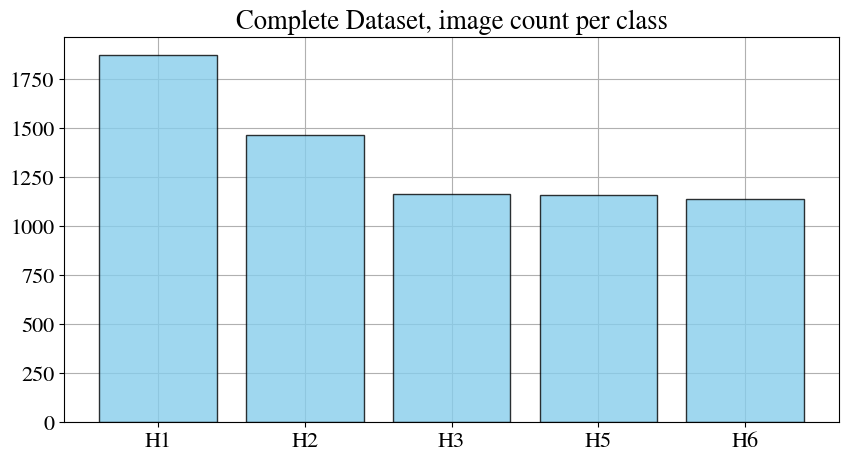

In [8]:
plt.figure(figsize = (10,5))
plt.bar(x = list(complete_data_class_dist.keys()), height = complete_data_class_dist.values(),edgecolor = "k", color = "skyblue",alpha = 0.8)
plt.title("Complete Dataset, image count per class")
plt.savefig('./figures/complete_dataset.png', dpi=300) 
plt.grid()

assign an integer class labels to each of the labels.

In [9]:
class_labels = {0:"Candida albicans",
                1:"Aspergillus niger", 
                2:"Trichophyton rubrum", 
                3:"Trichophyton mentagrophytes", 
                4:"Epidermophyton floccosum"}

create respective list, where each list contains respective class labels and their lengths match the number of samples in each class.

In [10]:
zero_class = list(np.zeros(complete_data_class_dist["H1"],dtype=int))
print(f"{len(zero_class)} 0 class labels")
one_class = list(np.ones(complete_data_class_dist["H2"],dtype=int))
print(f"{len(one_class)} 1 class labels")
two_class = list(np.ones(complete_data_class_dist["H3"],dtype=int) * 2)
print(f"{len(two_class)} 2 class labels")
three_class = list(np.ones(complete_data_class_dist["H5"],dtype=int) * 3)
print(f"{len(three_class)} 3 class labels")
four_class = list(np.ones(complete_data_class_dist["H6"],dtype=int) * 4)
print(f"{len(two_class)} 4 class labels")

1874 0 class labels
1465 1 class labels
1163 2 class labels
1160 3 class labels
1163 4 class labels


And then merge the images as well as class labels into two non-nested lists

In [11]:
labels = zero_class + one_class + two_class + three_class + four_class
images = []

for class_image_lists in complete_data_dict.values():
    images.extend(class_image_lists)
    
print(f"We have a total of {len(labels)} targets")
print(f"We have a total of {len(images)} images")

We have a total of 6801 targets
We have a total of 6801 images


create the main dataframe of our dataset:

In [12]:
df = pd.DataFrame({"images":images,"labels":labels})
df.head()

,images,labels
0,/Users/erdem/model-playground/data/train/H1/H1...,0
1,/Users/erdem/model-playground/data/train/H1/H1...,0
2,/Users/erdem/model-playground/data/valid/H1/H1...,0
3,/Users/erdem/model-playground/data/train/H1/H1...,0
4,/Users/erdem/model-playground/data/valid/H1/H1...,0


To ensure proper alignment letc check the last index of each image link that includes the corresponding class identifier substring, such as "H1".

In [13]:
label_arr = np.array(labels)
target_int_represenation = 0
for target in targets: 
    mask = df["images"].str.contains(target)
    print(f"\nClass: {target}\nLast Index: {df['images'][mask].index[-1] + 1}")
    print(f"The lenght of the class labels: {(label_arr == target_int_represenation).sum()}")
    target_int_represenation += 1


Class: H1
Last Index: 1874
The lenght of the class labels: 1874

Class: H2
Last Index: 3339
The lenght of the class labels: 1465

Class: H3
Last Index: 4502
The lenght of the class labels: 1163

Class: H5
Last Index: 5662
The lenght of the class labels: 1160

Class: H6
Last Index: 6801
The lenght of the class labels: 1139


In [14]:
def getRandomImages(dataframe,label,seed,sample_size):
    images = []
    labels = []
    df_selected_label = dataframe[dataframe['labels'] == label]
    np.random.seed(seed)
    random_indices = df_selected_label.sample(n=sample_size, replace=False, random_state=seed).index
    

    for index in random_indices:
        image_link = df_selected_label['images'][index]
        image_label = df_selected_label['labels'][index]
        image = Image.open(image_link)
        images.append(image)
        labels.append(image_label)
        
    return images,labels

In [15]:
def supPlotimage(images, labels, row_num, col_num,verbose = 2):
    fig, axes = plt.subplots(row_num, col_num, figsize=(20, 10))
    for i, image in enumerate(images):
        row = i // col_num
        col = i % col_num
        
        axes[row, col].imshow(image)
        axes[row, col].axis('off')
        if verbose ==0:
            continue
        elif verbose ==1:
            axes[row, col].set_title(f"Class: {class_labels[labels[i]]}")
        elif verbose ==2:
            axes[row, col].set_title(f"Class: {class_labels[labels[i]]}\nSize: {image.size}\n mean: {round(np.mean(image),1)}")
        else:
            raise ValueError("Value for verbose should be an int, either 0, 1 or 2")
    
    plt.tight_layout()
    plt.savefig('./figures/example_images.png', dpi=300) 
    plt.show()

In [17]:
def supPlotimagehist(images, labels, row_num, col_num, verbose = 2,single = True, normalized = False):
    colors = ["red","green","blue"]
    fig, axes = plt.subplots(row_num, col_num, figsize=(20, 10))
    for i, image in enumerate(images):
        row = i // col_num
        col = i % col_num
        
        # Convert PIL image to numpy array
        image_array = np.array(image)
        if single and not normalized: 
            hist = np.histogram(image_array, bins=256, range=(0, 256))[0]
            axes[row, col].plot(hist)
        elif single and normalized:
            hist = np.histogram(image_array, bins=256, range=(0, 1))[0]
            axes[row, col].plot(hist)
        elif not single and normalized:
             for channel in range(3):
                hist = np.histogram(image_array[:, :, channel], bins=256, range=(0, 1))[0]
                axes[row, col].plot(hist, label=f"Channel {channel}")
        else:
            for channel in range(3):
                hist = np.histogram(image_array[:, :, channel], bins=256, range=(0, 256))[0]
                axes[row, col].plot(hist, label=f"Channel {channel}", color = colors[channel])
         
        if verbose == 0:
            continue
        elif verbose ==1:
            axes[row, col].set_title(f"Class: {class_labels[labels[i]]}")
        elif verbose ==2:
            axes[row, col].set_title(f"Class: {class_labels[labels[i]]}\nSize: {image.size}\nIntensity: {round(np.min(image),1)}-{round(np.max(image),1)}, mean: {round(np.mean(image),1)}")
        else:
            raise ValueError("Value for verbose should be an int, either 0, 1 or 2")
    
    plt.tight_layout()
    plt.savefig('./figures/example_images_histograms.png', dpi=300) 
    plt.show()


-------------------------------------- Showcasing examples for class: 0 --------------------------------------



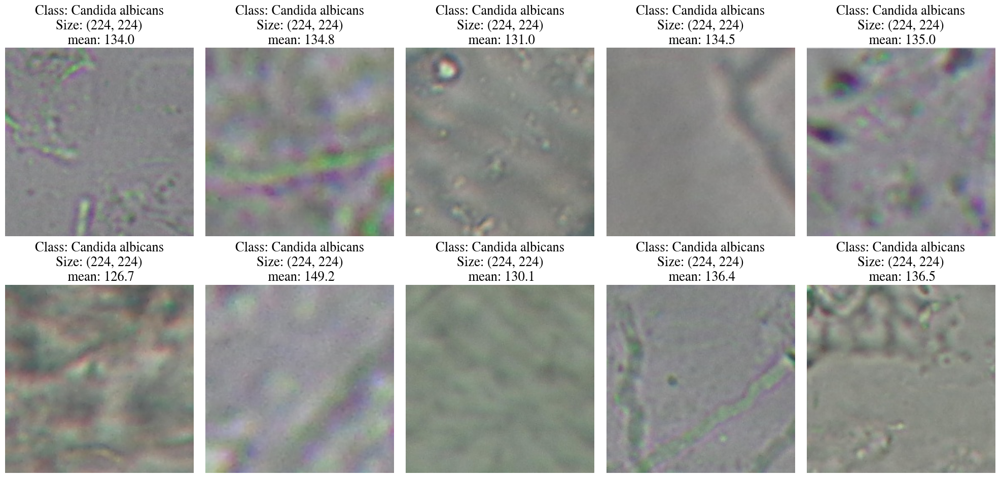

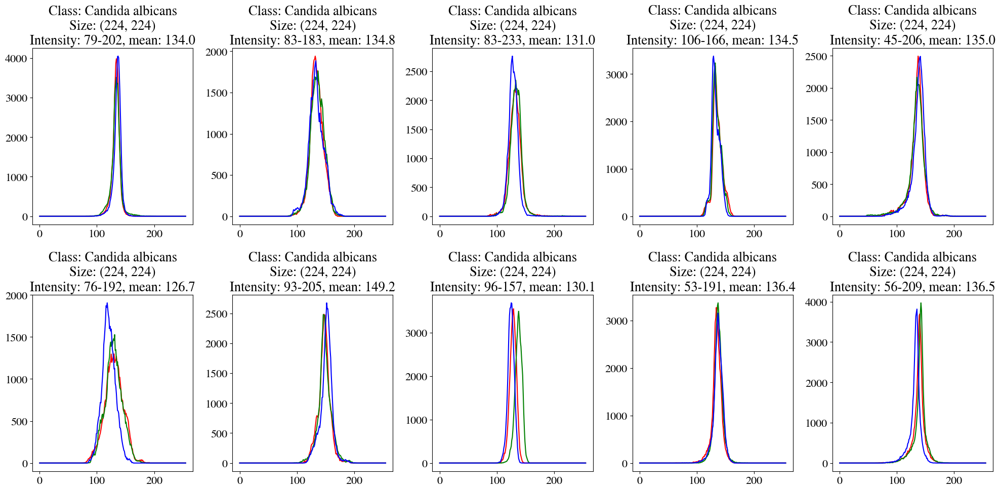


-------------------------------------- Showcasing examples for class: 1 --------------------------------------



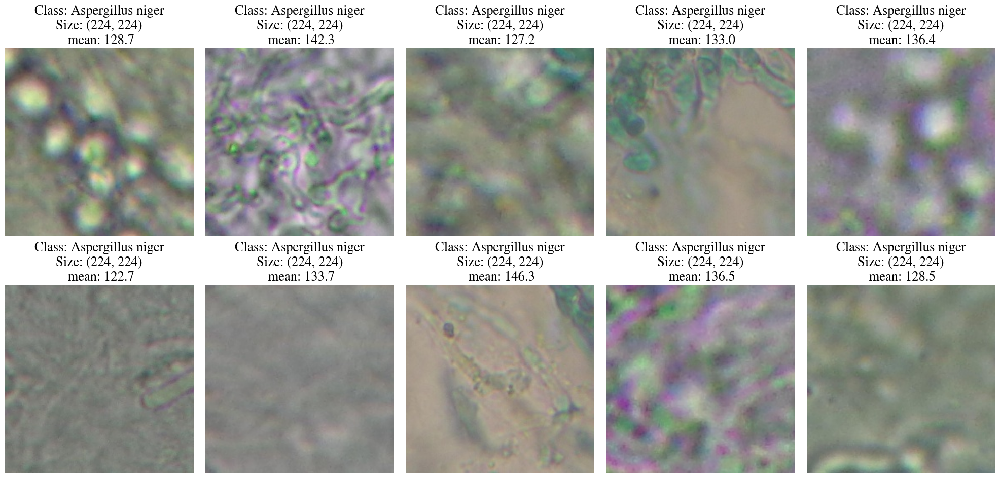

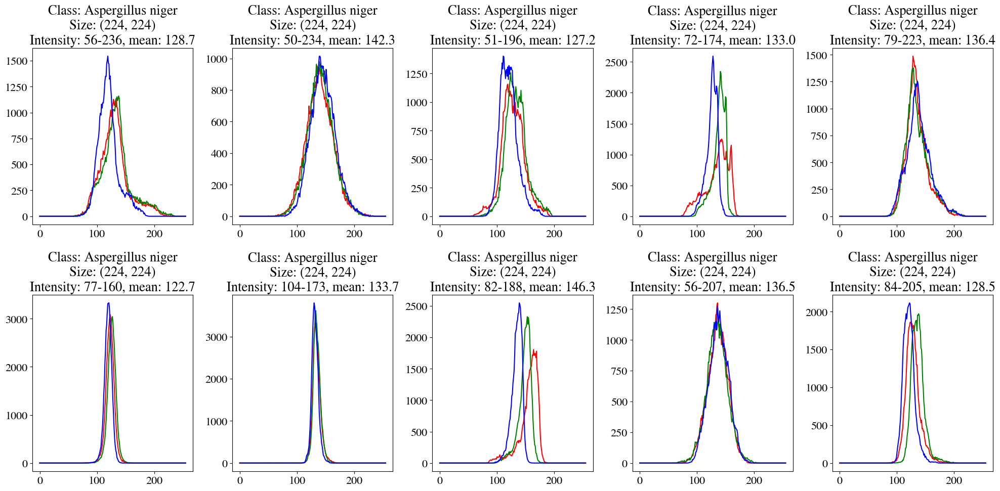


-------------------------------------- Showcasing examples for class: 2 --------------------------------------



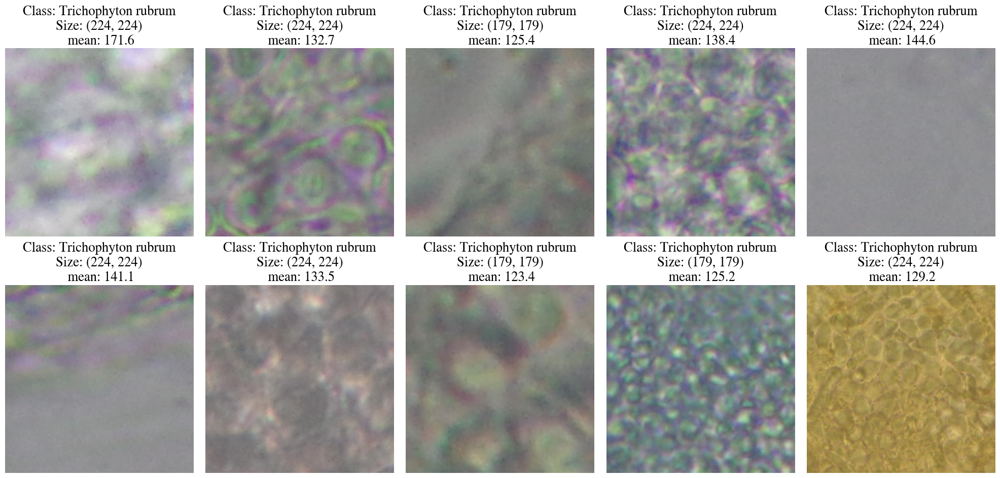

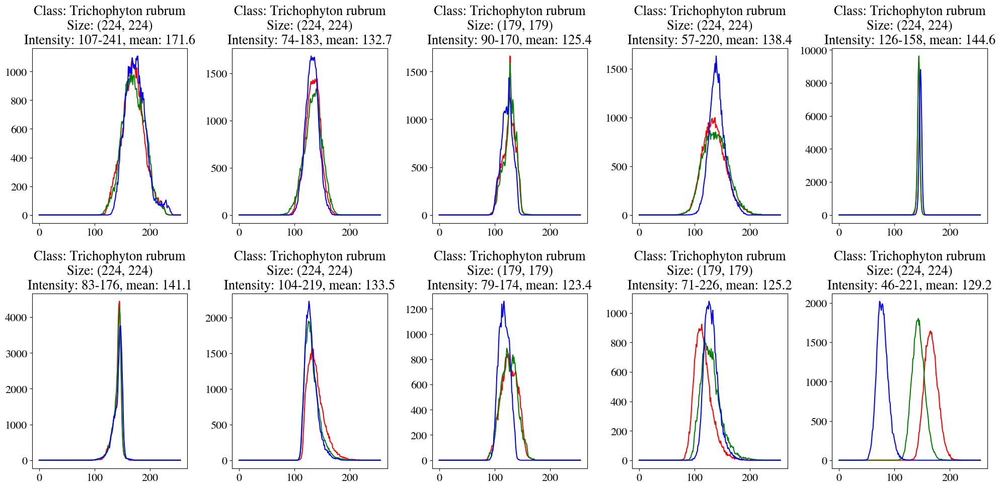


-------------------------------------- Showcasing examples for class: 3 --------------------------------------



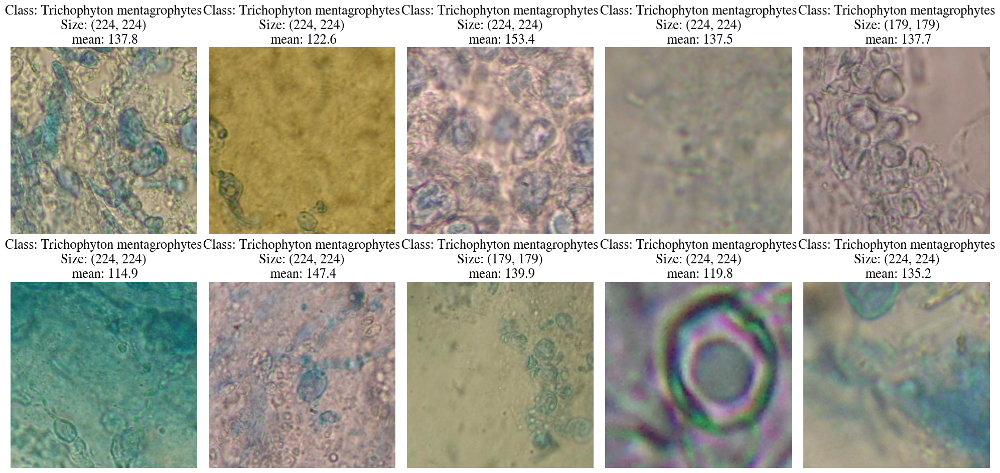

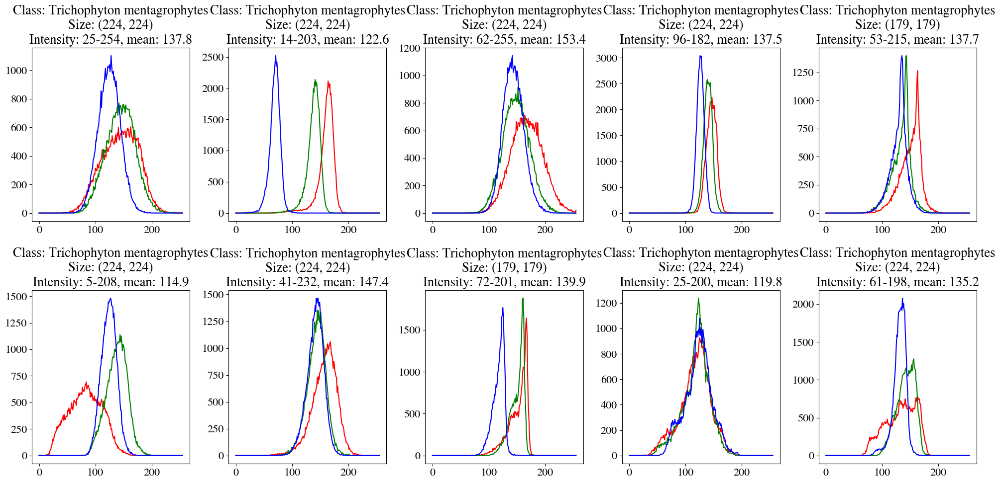


-------------------------------------- Showcasing examples for class: 4 --------------------------------------



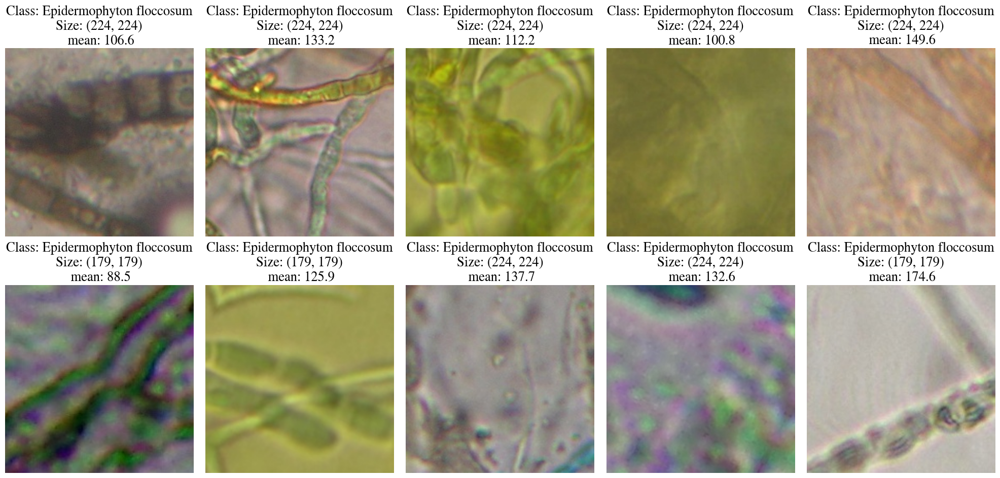

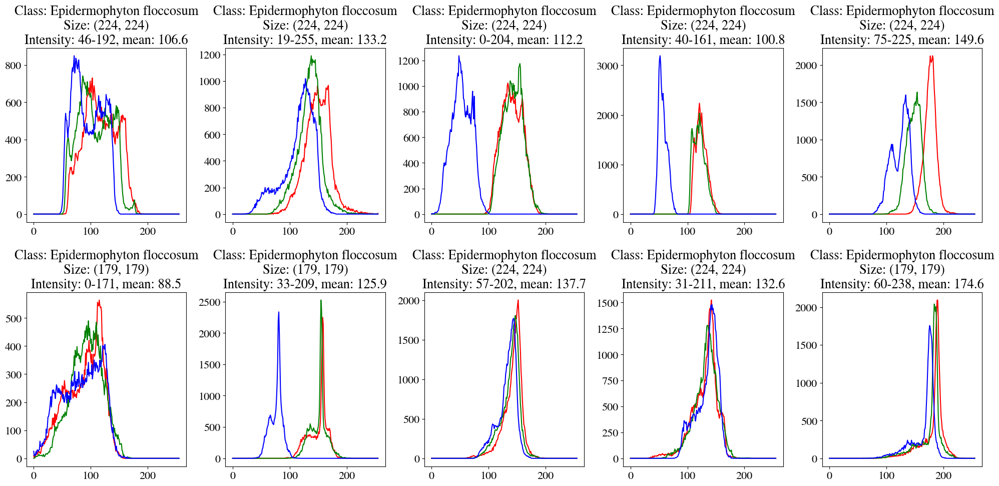

In [18]:
seed = 30
sample_size = 10
for class_label in range(5):
    print(f"\n-------------------------------------- Showcasing examples for class: {class_label} --------------------------------------\n")
    images,labels = getRandomImages(dataframe=df,label=class_label,seed=seed,sample_size=sample_size)
    supPlotimage(images,labels,row_num=2,col_num=5)
    supPlotimagehist(images, labels, row_num=2, col_num=5,single=False)

some images have a size of (179,179) lets check if other sizes exist

In [19]:
size_counts = {}
for observation in df['images']:
    image = Image.open(observation)
    size = image.size[0]
    if size in size_counts.keys():
        size_counts[size] += 1
    else:
        size_counts[size] = 0
        
size_counts

{224: 6248, 179: 551}

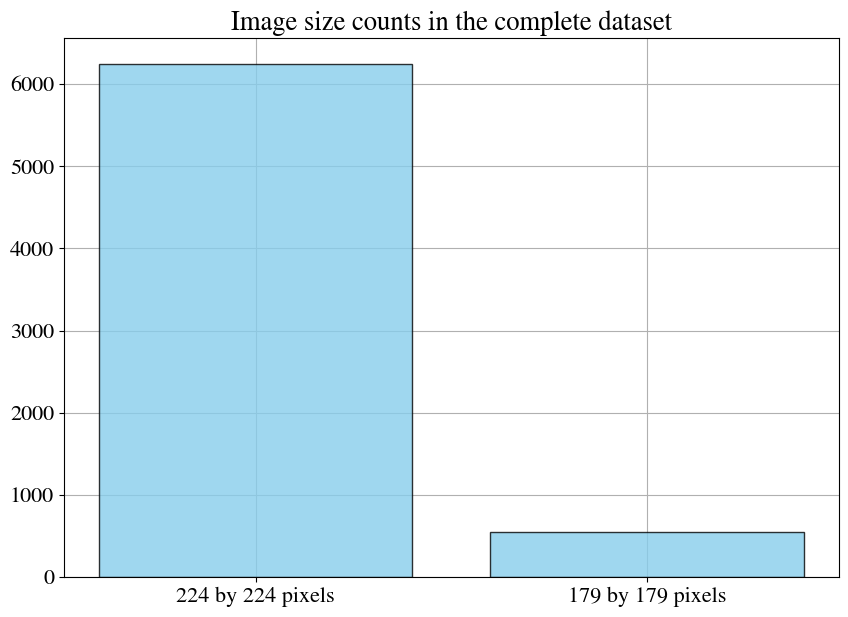

In [20]:
plt.figure(figsize = (10,7))
plt.bar(x = [f"{size} by {size} pixels" for size in size_counts.keys()],height = size_counts.values(), color = "skyblue", edgecolor = "k", alpha = 0.8)
plt.title("Image size counts in the complete dataset")
plt.savefig('./figures/image_size_distribution.png', dpi=300) 
plt.grid()

We can handle the resizing of the 179 by 179 images by utilizing BILINEAR interpolation of the PIL library.

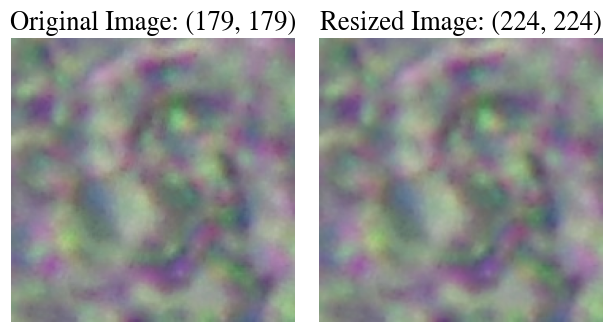

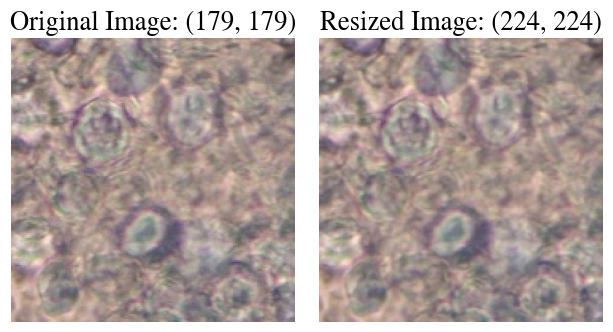

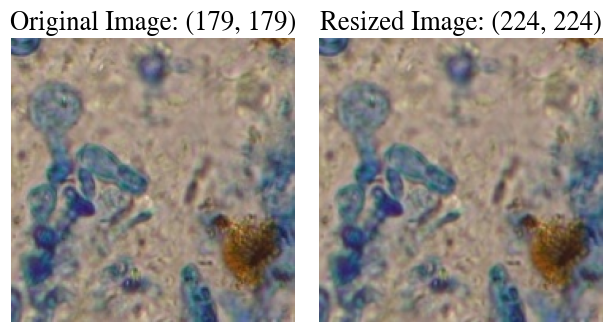

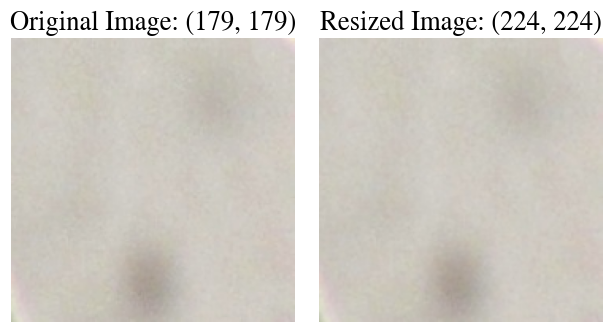

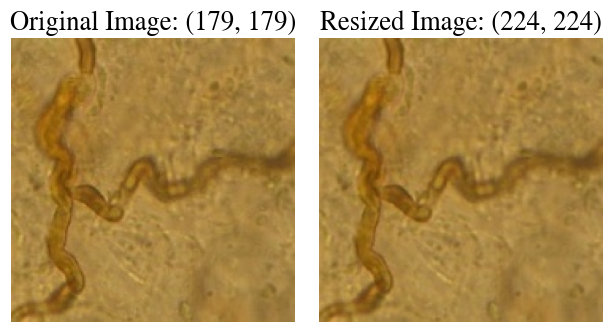

In [ ]:
count = 0
for i,observation in enumerate(df['images']):
    image = Image.open(observation)
    size = image.size[0]
    if size == 179:
        count += 1
        resized_image = image.resize((224, 224), Image.BILINEAR)
        df['images'][i] = resized_image
        if count%100 == 0:
            plt.subplot(1, 2, 1)  # First subplot
            plt.imshow(image)
            plt.axis("off")
            plt.title(f"Original Image: {image.size}")

            plt.subplot(1, 2, 2)  # Second subplot
            plt.imshow(resized_image)
            plt.axis("off")
            plt.title(f"Resized Image: {resized_image.size}")
            plt.tight_layout()  
            plt.savefig('./figures/resizing_examples.png', dpi=300) 
            plt.show()  
    else:
        df['images'][i] = image

In [22]:
df.head()

,images,labels
0,<PIL.JpegImagePlugin.JpegImageFile image mode=...,0
1,<PIL.JpegImagePlugin.JpegImageFile image mode=...,0
2,<PIL.JpegImagePlugin.JpegImageFile image mode=...,0
3,<PIL.JpegImagePlugin.JpegImageFile image mode=...,0
4,<PIL.JpegImagePlugin.JpegImageFile image mode=...,0


DataSet Creation
Its intresting to see how much more information we can achieve with the colored RGB images vs grayscale images.

1.An RGB one, with images of shape (224,224,3)
2.A gray scale one, with images of shape (224,224,1)
3.A flattened RGB one, with flattened images of shape (150528,)
4.A flattened grayscale one, with flattened images of shape (50176)

Grayscale & RGB datasets

In [23]:
df_gray = pd.DataFrame()
# Use convert(L) to convert an rgb image to grayscale using PIL library
df_gray['images'] = df['images'].apply(lambda x: x.convert("L"))
df_gray['labels'] = df['labels']

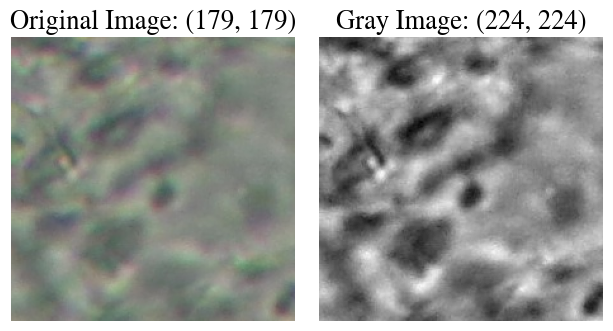

In [24]:
plt.subplot(1, 2, 1)  
plt.imshow(df['images'][233])
plt.axis("off")
plt.title(f"Original Image: {image.size}")

plt.subplot(1, 2, 2)  
plt.imshow(df_gray['images'][233], cmap = "gray" )
plt.axis("off")
plt.title(f"Gray Image: {resized_image.size}")
plt.tight_layout() 
plt.savefig('./figures/gray_scale_conversion.png', dpi=300) 
plt.show() 

go ahead and convert the PIL objects to numpy pixel value arrays 

In [25]:
df['images'] = df['images'].apply(lambda x :  np.array(x))
df_gray['images'] = df_gray['images'].apply(lambda x :  np.array(x))

store the DataFrames using the Hierarchical Data Format (HDF5) which is able to handle multi dimensional arrays.

In [27]:
df.to_hdf('rgb_data.h5', key='rgb_data', mode='w')
df_gray.to_hdf('gray_data.h5', key='gray_data', mode='w')

Flattened Grayscale & RGB datasets

In [28]:
df_flattened = pd.DataFrame()
df_flattened['images'] = df['images'].apply(lambda x :  x.flatten())
df_flattened['labels'] = df['labels']

df_gray_flattened = pd.DataFrame()
df_gray_flattened['images'] = df_gray['images'].apply(lambda x :  x.flatten())
df_gray_flattened['labels'] = df_gray['labels']

Dimensionality Reduction & Data Visualization

In this phase, we utilize dimensionality reduction and data visualization techniques to gain insights into the distinct separability of classes within our datasets. Of course before any of the above we need to normalize our data.

In [29]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

First we standardize the X_gray dataset

In [30]:
X_gray = np.vstack(df_gray_flattened['images'])
X_gray = scaler.fit_transform(X_gray)

Then the colored dataset

In [32]:
X_rgb = np.vstack(df_flattened['images'])
X_rgb = scaler.fit_transform(X_rgb)

PCA
In order to establish a visualization of class seperation, we emply PCA to reduce the dimensions of the dataset by retaining only 
of the total variance.

First in the grayscale dataset
And then in the RGB dataset

In [33]:
pca_gray = PCA(n_components = 700)
X_pca_gray = pca_gray.fit_transform(X_gray)

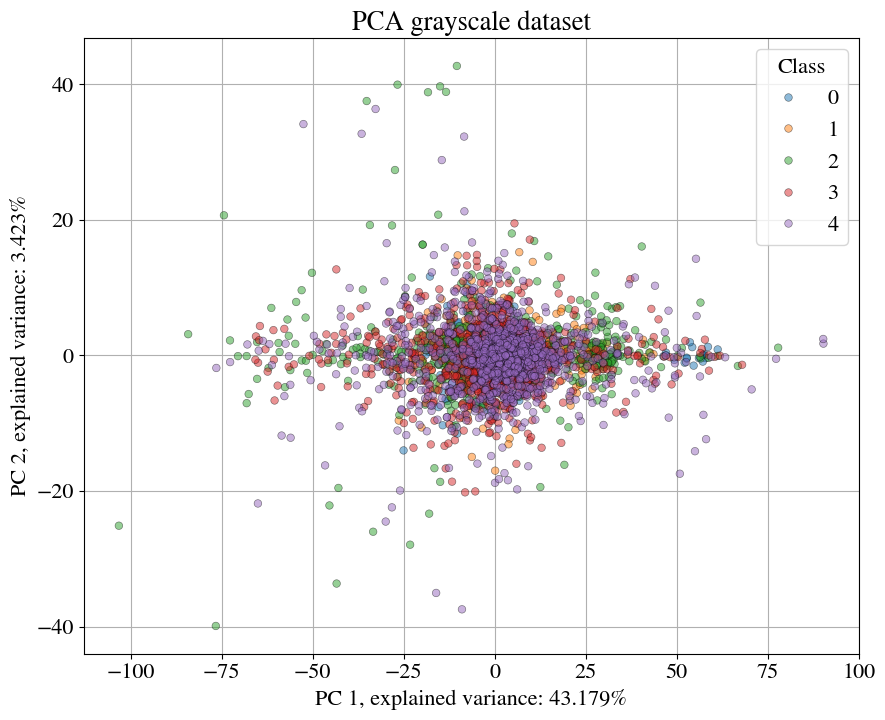

In [34]:
plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_pca_gray[:,0], y=X_pca_gray[:,1], hue=df_gray_flattened['labels'].values, palette='tab10', s=30, alpha = 0.5,edgecolor='black')
plt.title('PCA grayscale dataset')
plt.grid()
plt.xlabel(f'PC 1, explained variance: {round(pca_gray.explained_variance_ratio_[0]*100,3)}%')
plt.ylabel(f'PC 2, explained variance: {round(pca_gray.explained_variance_ratio_[1]*100,3)}%')
plt.legend(title='Class')
plt.savefig('./figures/pca_gray.png', dpi=300) 
plt.show()

We also want to plot a UMAP visualization of the dataset, however working with 50176 dimensions is incredibly computationally expensive. Thus we only keep the PCs that result in a total of 95% total variance

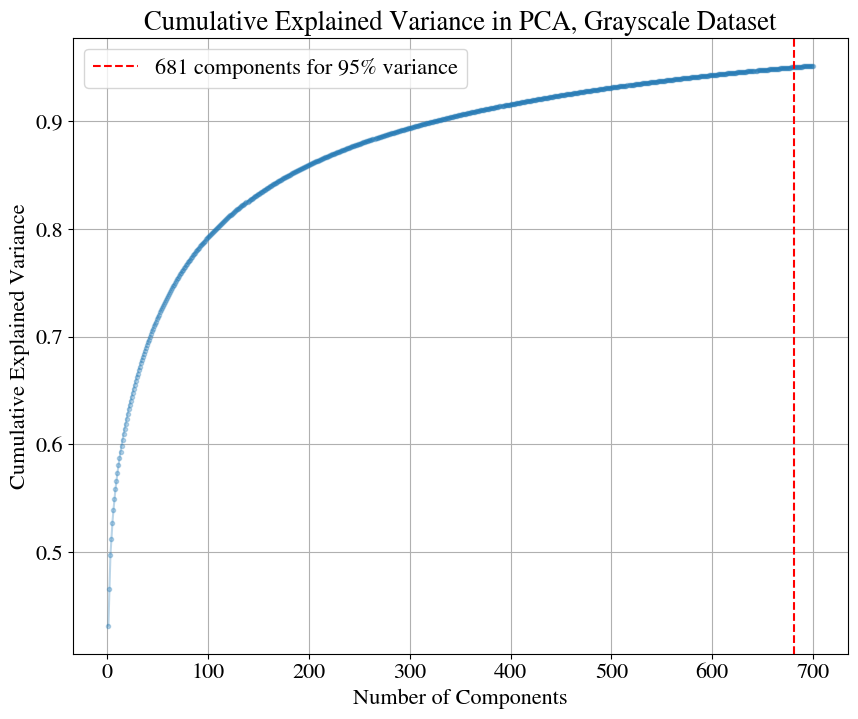

In [35]:
explained_variance = pca_gray.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance)
n_components = np.argmax(cumulative_explained_variance >= 0.95) + 1

plt.figure(figsize=(10, 8))
plt.plot(np.arange(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='.', alpha = 0.3)
plt.axvline(x=n_components, color='r', linestyle='--', label=f'{n_components} components for 95% variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance in PCA, Grayscale Dataset')
plt.legend()
plt.grid(True)
plt.savefig('./figures/explained_var_gray.png', dpi=300) 
plt.show()

In [36]:
X_pca_gray_opt = X_pca_gray[:,:n_components]
print(f"The pca 95% variance dataset has {df_gray_flattened['images'][0].shape[0] - X_pca_gray_opt.shape[1]} fewer dimensions than the original")

The pca 95% variance dataset has 49495 fewer dimensions than the original


RGB Dataset

In [37]:
pca_rgb = PCA(n_components = 950)
X_pca_rgb = pca_rgb.fit_transform(X_rgb)

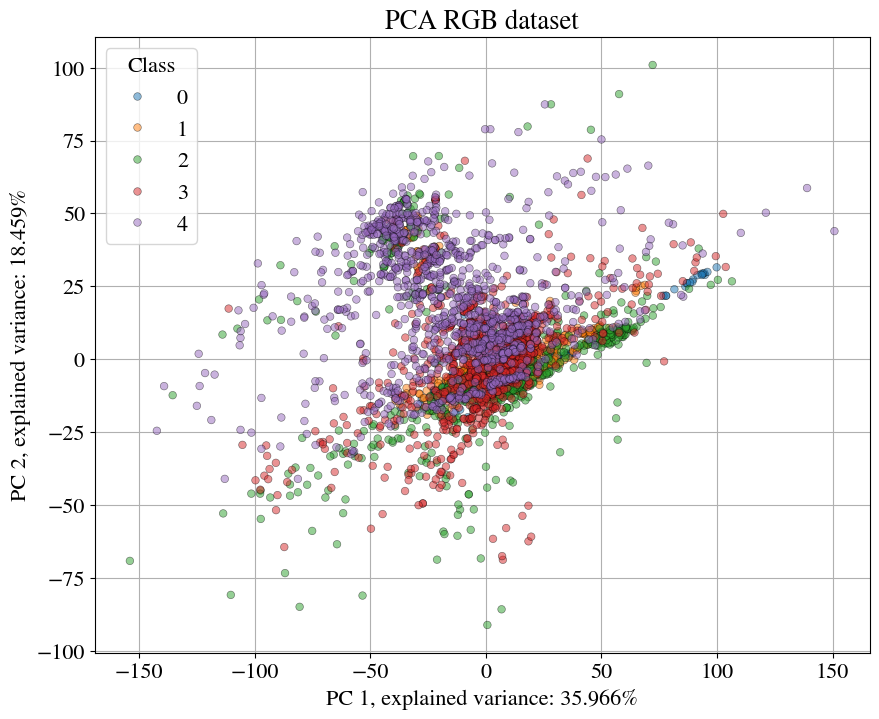

In [38]:
plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_pca_rgb[:,0], y=X_pca_rgb[:,1], hue=df_flattened['labels'].values, palette='tab10', s=30, alpha = 0.5,edgecolor='black')
plt.title('PCA RGB dataset')
plt.grid()
plt.xlabel(f'PC 1, explained variance: {round(pca_rgb.explained_variance_ratio_[0]*100,3)}%')
plt.ylabel(f'PC 2, explained variance: {round(pca_rgb.explained_variance_ratio_[1]*100,3)}%')
plt.legend(title='Class')
plt.savefig('./figures/pca_rgb.png', dpi=300) 
plt.show()

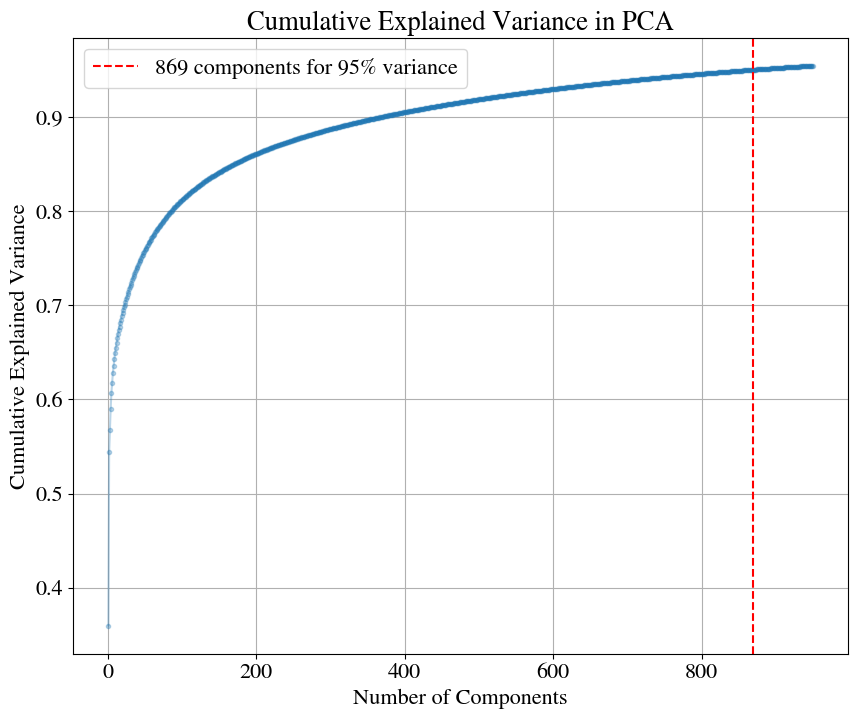

In [39]:
explained_variance = pca_rgb.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance)
n_components = np.argmax(cumulative_explained_variance >= 0.95) + 1

plt.figure(figsize=(10, 8))
plt.plot(np.arange(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='.', alpha = 0.3)
plt.axvline(x=n_components, color='r', linestyle='--', label=f'{n_components} components for 95% variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance in PCA')
plt.legend()
plt.grid(True)
plt.savefig('./figures/explained_var_rgb.png', dpi=300) 
plt.show()

In [40]:
X_pca_rgb_opt = X_pca_rgb[:,:n_components]
print(f"The pca 95% variance dataset has {df_flattened['images'][0].shape[0] - X_pca_rgb_opt.shape[1]} fewer dimensions than the original")

The pca 95% variance dataset has 149659 fewer dimensions than the original


UMAP
Grayscale Dataset

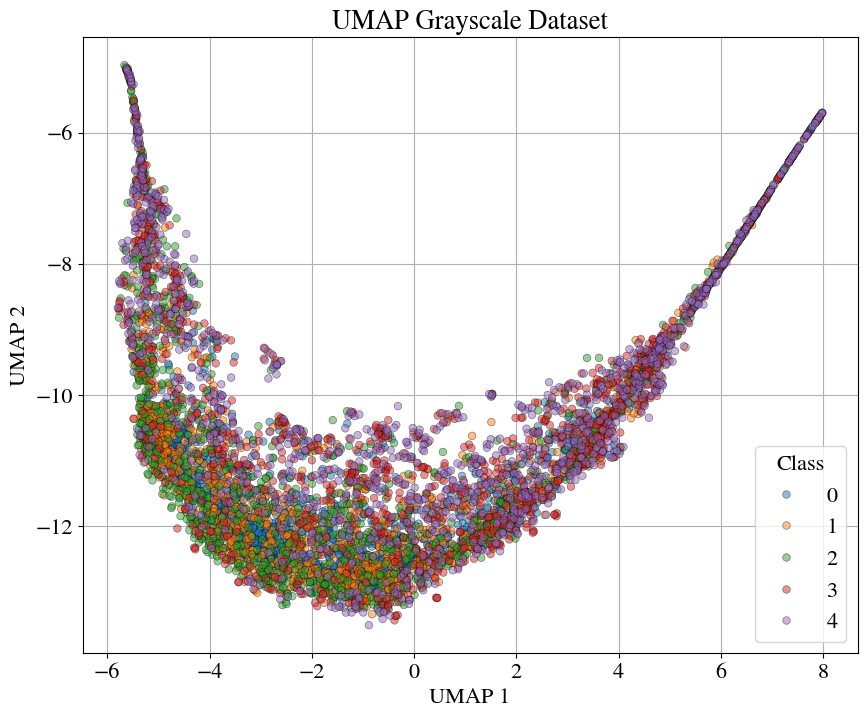

In [41]:
umap_model_gray = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2)
X_gray_umap = umap_model_gray.fit_transform(X_pca_gray_opt)

plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_gray_umap[:,0], y=X_gray_umap[:,1], hue=df_flattened['labels'].values, palette='tab10', s=30, alpha = 0.5,edgecolor='black')
plt.title('UMAP Grayscale Dataset')
plt.grid()
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend(title='Class')
plt.savefig('./figures/umap_gray.png', dpi=300) 
plt.show()

RGB Dataset

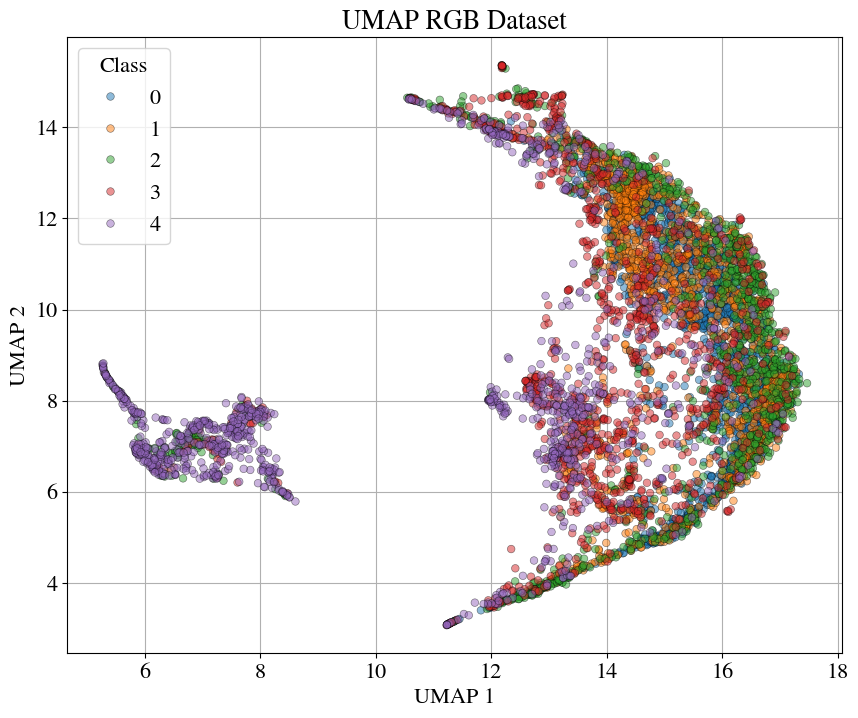

In [42]:
umap_model_rgb = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2)
X_rgb_umap = umap_model_rgb.fit_transform(X_pca_rgb_opt)

plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_rgb_umap[:,0], y=X_rgb_umap[:,1], hue=df_flattened['labels'].values, palette='tab10', s=30, alpha = 0.5,edgecolor='black')
plt.title('UMAP RGB Dataset')
plt.grid()
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend(title='Class')
plt.savefig('./figures/umap_gray.png', dpi=300) 
plt.show()